In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv('../data/raw/star_classification.csv')

<Axes: xlabel='class', ylabel='count'>

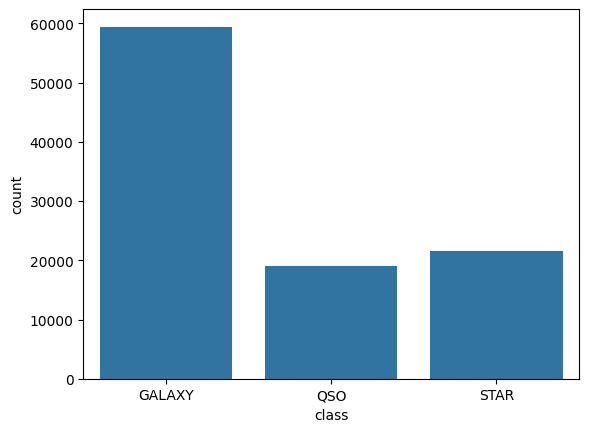

In [2]:
#repartition of the classes
sns.countplot(x='class', data=df)

obj_ID, run_ID, camcol, field_ID, rerun_ID, plate, MJD, fiber_ID, spec_obj_id columns correspond to identifier of diverse measure equipment. We drop the first 7 columns as they are not useful for our analysis. For the last column we will check for duplicates as an object can be observed more than once but it should have a unique spectrograph ID.

In [3]:
df=df.drop(['obj_ID','run_ID','rerun_ID','cam_col','field_ID','plate','MJD','fiber_ID'], axis=1)

In [4]:
# check for double entries for spec_obj_ID
print(df[df.duplicated(['spec_obj_ID'],keep='first')])

Empty DataFrame
Columns: [alpha, delta, u, g, r, i, z, spec_obj_ID, class, redshift]
Index: []


There is no duplicate in the spectrograph ID column. We can drop it. As well as Alpha and Delta as they are not useful for our analysis. (they correspond to the coordinates of the object in the sky)

In [4]:
#drop the columns that are not relevant for the classification
df=df.drop(['spec_obj_ID','alpha','delta'], axis=1)

<Axes: >

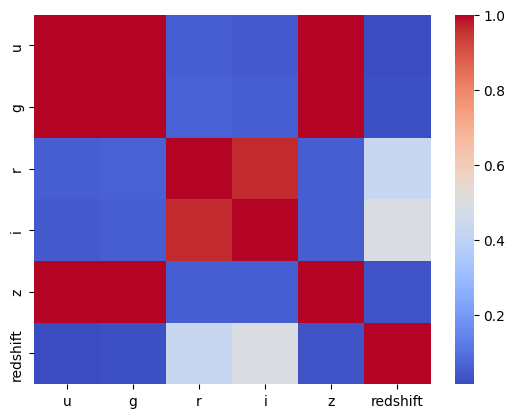

In [5]:
#correlation matrix
df_w = df.drop(['class'], axis=1)
corr = df_w.corr()
sns.heatmap(corr, annot=False, cmap='coolwarm')

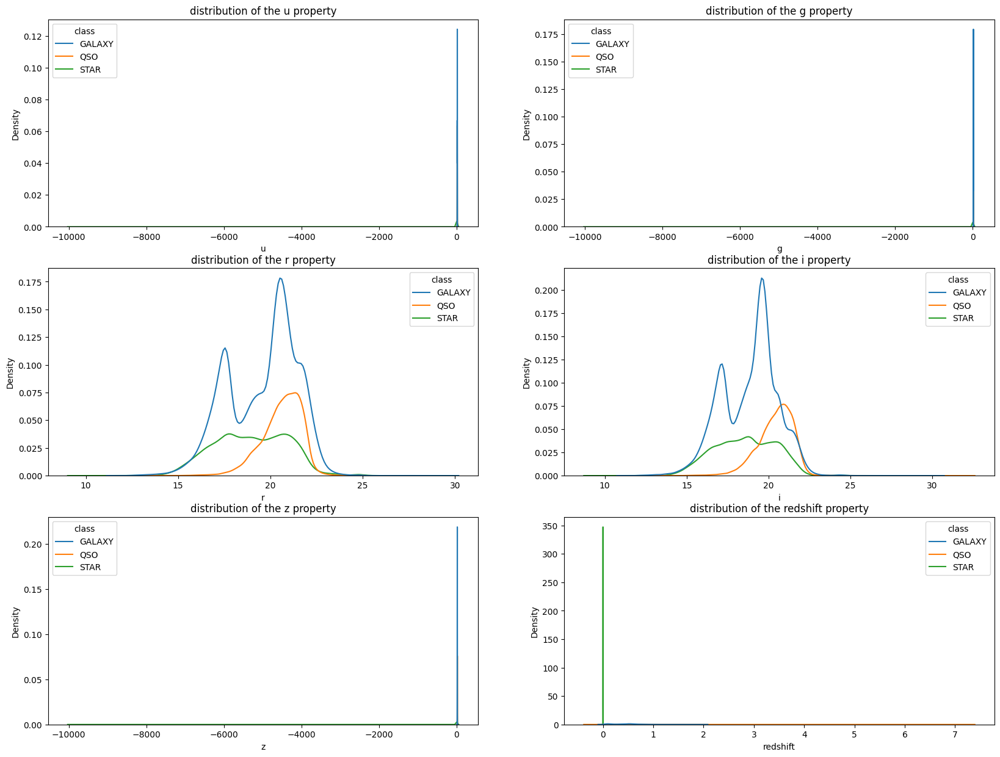

In [6]:
#data distribution
fig, axes = plt.subplots(3, 2, figsize=(20, 15))
axes = axes.flatten()
for i,var in enumerate(df_w.columns[:]):
    sns.kdeplot(data=df, x=var, hue='class', ax=axes[i])
    axes[i].set_title("distribution of the "+ var+" property")


For g, z, u and redshift we can see some abnormal values, but we can't realy see well the distribution of the data. Let's try to plot the data in log scale.

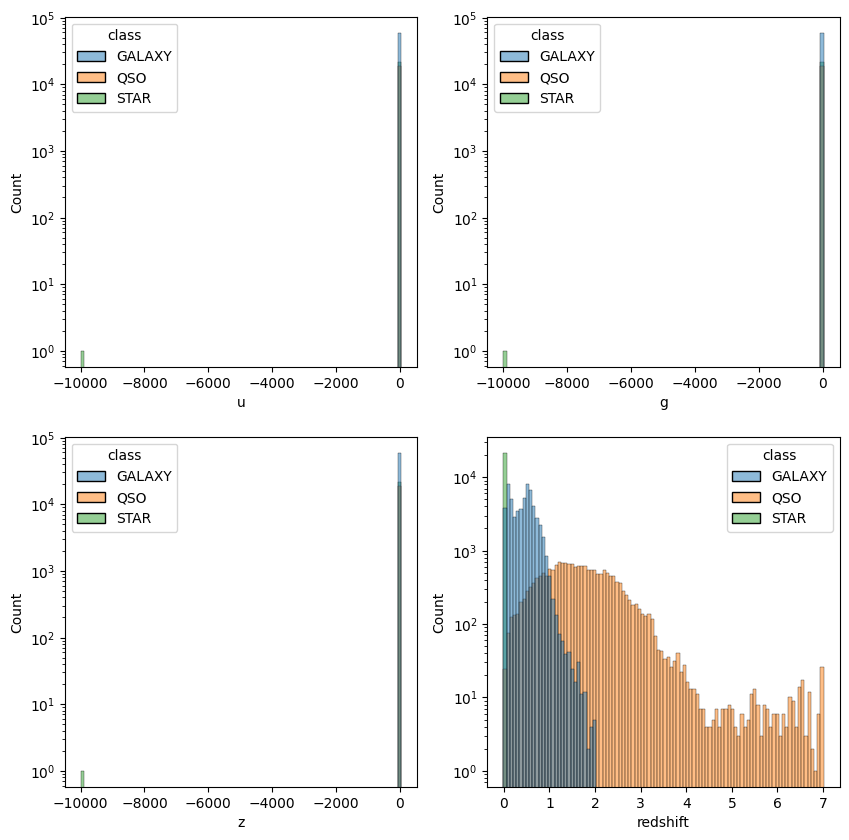

In [7]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()

sns.histplot(data=df, x='u', hue='class', bins=100, ax=axes[0])
axes[0].set_yscale('log')
sns.histplot(data=df, x='g', hue='class', bins=100, ax=axes[1])
axes[1].set_yscale('log')
sns.histplot(data=df, x='z', hue='class', bins=100, ax=axes[2])
axes[2].set_yscale('log')
sns.histplot(data=df, x='redshift', hue='class', bins=100, ax=axes[3])
axes[3].set_yscale('log')


Almost every value in g, z and u are close to 0, exept for 1 point near -100000. Let's remove it. 

In [6]:
df = df[df['g'] > -2000]
df = df[df['z'] > -2000]
df = df[df['u'] > -2000]

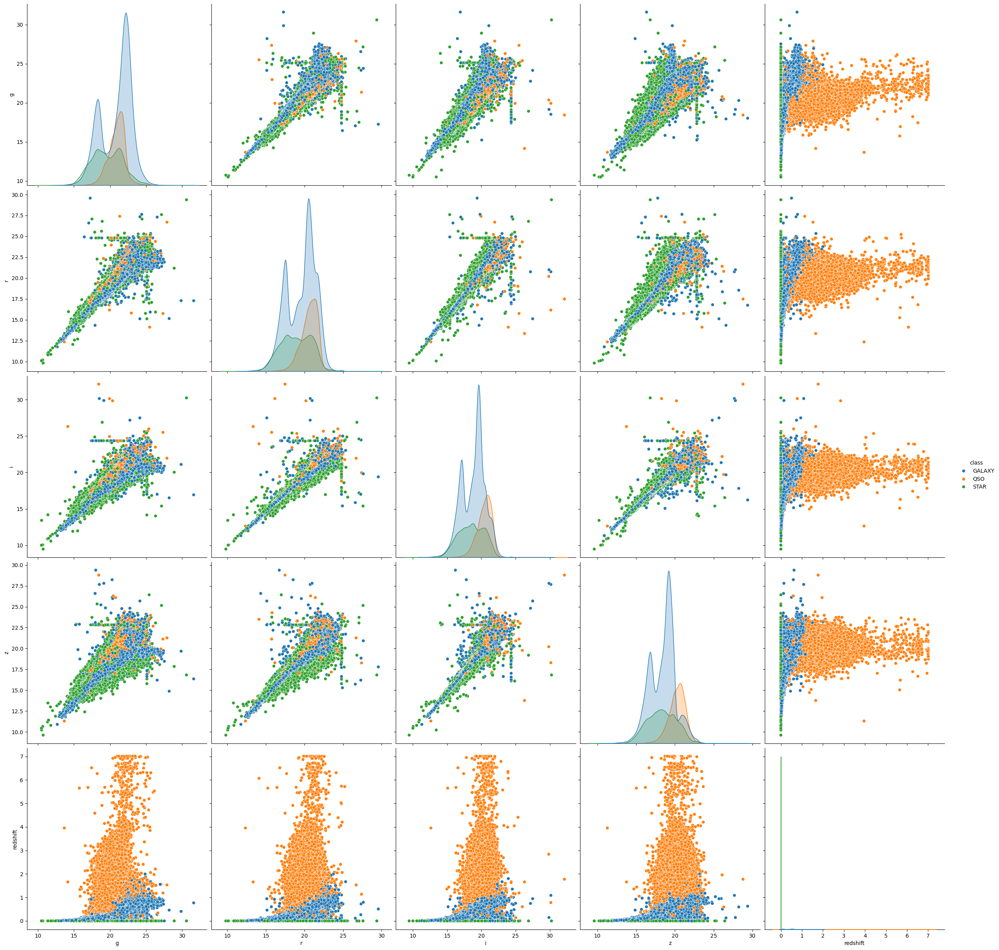

In [11]:
#show for each class the distribution of the features
sns.pairplot(df, hue='class', vars=['g','r','i','z','redshift'], height=5)


Number of outliers for class GALAXY: 1531
Number of outliers for class QSO: 381
Number of outliers for class STAR: 1030


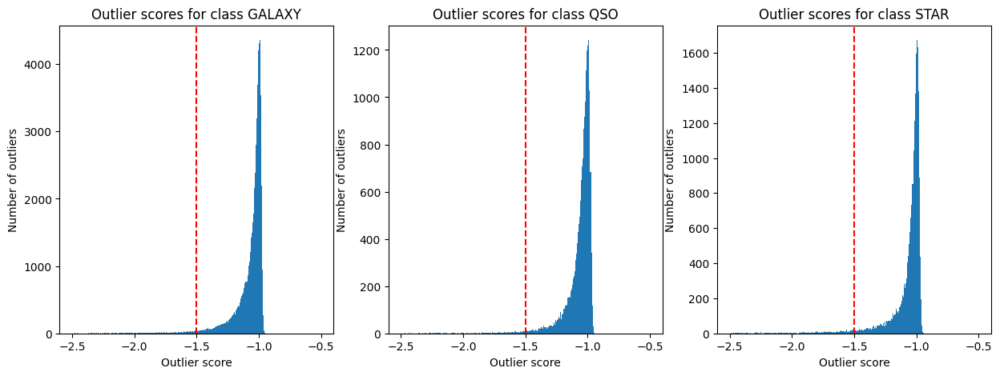

In [7]:
#detect outliers
from sklearn.neighbors import LocalOutlierFactor
df_outliers = df.copy()
outlier_detection = LocalOutlierFactor()
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes = axes.flatten()
elbow = -1.5
for i,clas in enumerate(df['class'].unique()):
    outlier_detection.fit_predict(df[df["class"]==clas].drop(['class'], axis=1))
    outlier_score = outlier_detection.negative_outlier_factor_
    axes[i].hist(outlier_score, bins=300, range=(-2.5,-0.5))
    axes[i].set_xlabel('Outlier score')
    axes[i].set_ylabel('Number of outliers')
    axes[i].set_title('Outlier scores for class '+str(clas))
    # plot the elbow
    axes[i].axvline(x=elbow, color='r', linestyle='--') 
    print("Number of outliers for class "+str(clas)+": "+str(len(outlier_score[outlier_score<elbow])))
    df_outliers.loc[df_outliers['class']==clas,'outlier_score'] = outlier_score
    
#remove outliers
df_outliers['outlier'] = df_outliers['outlier_score']<elbow
df_outliers = df_outliers.drop(['outlier_score'], axis=1)
df_galaxy = df_outliers[df_outliers['class']=='GALAXY']
df_star = df_outliers[df_outliers['class']=='STAR']
df_qso = df_outliers[df_outliers['class']=='QSO']

In [110]:
#UMAP redution of the dimension to be able to plot the data
import umap

reducer = umap.UMAP()
embedding = pd.DataFrame(reducer.fit_transform(df_outliers.drop(['class','outlier'], axis=1)))
embedding_GALAXY = pd.DataFrame(reducer.fit_transform(df_galaxy.drop(['class','outlier'], axis=1)))
embedding_QSO = pd.DataFrame(reducer.fit_transform(df_qso.drop(['class','outlier'], axis=1)))
embedding_STAR = pd.DataFrame(reducer.fit_transform(df_star.drop(['class','outlier'], axis=1)))

In [8]:
from src.visualization.rpca import R_pca
from sklearn.decomposition import TruncatedSVD

df_matrix = df_outliers.drop(['class','outlier'], axis=1).values
rpca = R_pca(df_matrix)
L, S = rpca.fit(max_iter=10000, iter_print=100)
svd = TruncatedSVD(n_components=2)
L_2d = svd.fit_transform(L)

iteration: 1, error: 22.40519073552552
iteration: 100, error: 0.22511804143943842
iteration: 200, error: 0.0796494551178977
iteration: 300, error: 0.038722156364736804
iteration: 400, error: 0.02105414816871471
iteration: 500, error: 0.011961974293128612
iteration: 600, error: 0.0071395329972745855
iteration: 700, error: 0.004690714844177937
iteration: 800, error: 0.0030375981286036766
iteration: 900, error: 0.001981030202115074
iteration: 1000, error: 0.0015484098229569965
iteration: 1019, error: 0.0014201183088752318


In [10]:
print(L.shape)

(99999, 6)


<Axes: >

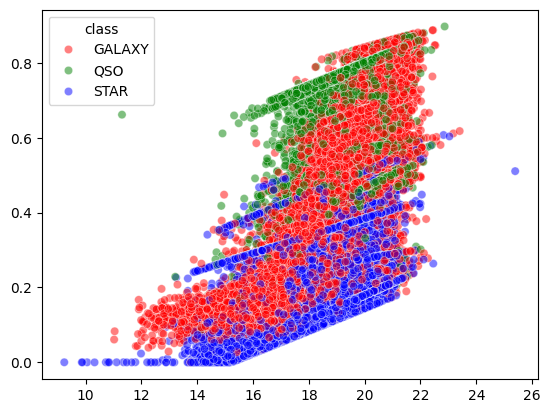

In [20]:
#plot L
sns.scatterplot(x=L[:,4], y=L[:,5], hue=df_outliers['class'], palette=['red','green','blue'], alpha=0.5)


Text(0, 0.5, 'UMAP 2')

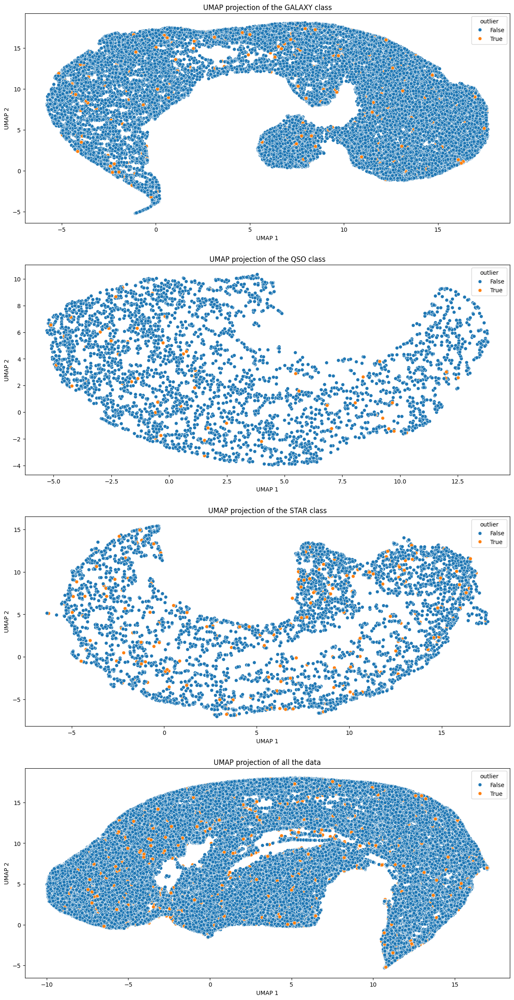

In [112]:
fig, axes = plt.subplots(4, 1, figsize=(15, 30))
axes = axes.flatten()
classes = ['GALAXY','QSO','STAR']

for i,embedding_i in enumerate([embedding_GALAXY, embedding_QSO, embedding_STAR]):
    sns.scatterplot(data=embedding_i, x=0, y=1, hue=df_outliers[df_outliers['class']==classes[i]]['outlier'], ax=axes[i])
    axes[i].set_title('UMAP projection of the '+classes[i]+' class')
    axes[i].set_xlabel('UMAP 1')
    axes[i].set_ylabel('UMAP 2')

sns.scatterplot(data=embedding, x=0, y=1, hue=df_outliers['outlier'], ax=axes[3])
axes[3].set_title('UMAP projection of all the data')
axes[3].set_xlabel('UMAP 1')
axes[3].set_ylabel('UMAP 2')

Now we normalise the data using Robust scaler to not be affected by outliers.

In [120]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
df_scale = df.drop(['class'], axis=1)
df_scale = scaler.fit_transform(df_scale)
df_scale = pd.DataFrame(df_scale, columns=['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'redshift'])
df_scale['class'] = df['class']

Now we plot the data with the scaled features

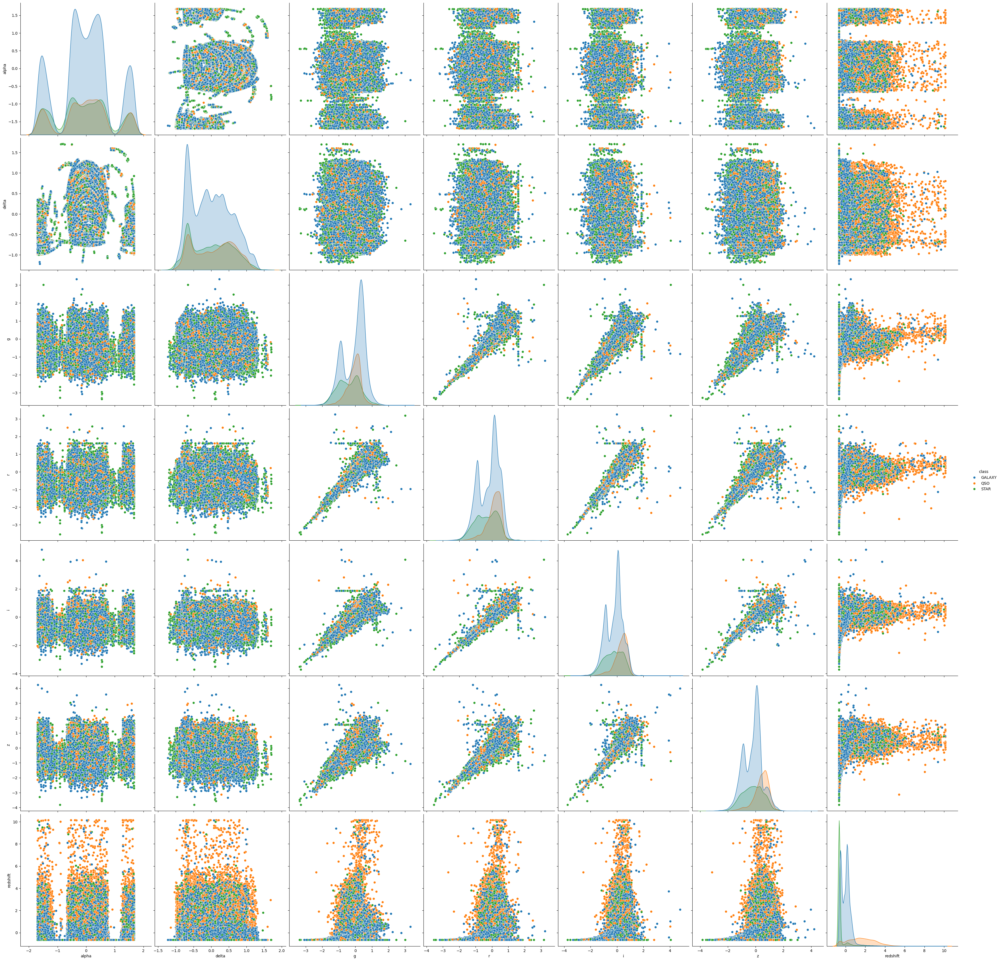

In [121]:
sns.pairplot(df_scale, hue='class', vars=['alpha','delta','g','r','i','z','redshift'], height=5)